In this assignment, you will learn how to create a depth map from stereo images.

For that, we will do it in several parts:

1. **Load the images.**<p>
There are 6 images coming from the KITTI VISION BENCHMARK SUITE.

2. **Create a Disparity Map**<p>
Use the algorithms we've learned to try and build a disparity map!

3. **Get the Calibration Parameters**<p>
Use the camera calibration workshop or the calibration files provided to load the matrices.

4. **Compute the Depth Map**<p>
Use these matrices and the disparity to build a depth map.

In [32]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image
from ipywidgets import interact, interactive, fixed
import glob

# Step 1 - Load image data

There are 6 images


Text(0.5, 1.0, 'Image Right')

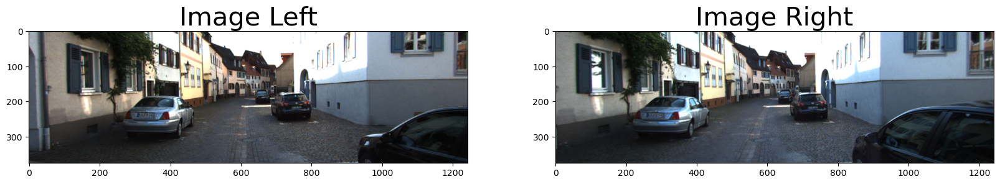

In [33]:
images_L = sorted(glob.glob("data/left/*.png"))
images_R = sorted(glob.glob("data/right/*.png"))
calib_files = sorted(glob.glob("data/calib/*.txt"))

print("There are",len(images_L),"images")

index = 5

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(cv2.cvtColor(cv2.imread(images_L[index]), cv2.COLOR_BGR2RGB))
ax1.set_title('Image Left', fontsize=30)
ax2.imshow(cv2.cvtColor(cv2.imread(images_R[index]), cv2.COLOR_BGR2RGB))
ax2.set_title('Image Right', fontsize=30)

# Step 2 - Calculate the Disparity Map
In this section, we need to implement two classic disparity estimation algorithms StereoBM and StereoSGBM.


## Compute And Display the Disparity

In [34]:
def compute_disparity(image, img_pair, num_disparities=6*16, block_size=11, matcher="bm", show_disparity=True):
    """
    Step-I: Create a StereoMatcher, which may apply Block Matching, or Semi-Global Block Matching by Dynamic Programming
    Step-II: Compute the Matching
    Step-III: Display the disparity map
    Step-IV: Return the disparity map

    Args:
        image: a gray-scale image
        image_pair: a gray-scale image that is paired with the image
        num_disparities: the disparity search range
        block_size: the size of the block for matching
        matcher: "bm" for Block Matching, "dp" for Dynamic Programming
        show_disparity: True to display the disparity map

    Return:
        the disparity map

    Note: 
        1. The StereoMatcher should be a class, which has a function StereoMatcher.compute(image, image_pair) for actual disparity calculation.
        2. Using cv2.StereoBM_create in opencv will just earn half of the credits.
    """

    """
    pdf的要求:
    Note that you need to detect and mask out occluded and dis-occluded area in the disparity map, in which the estimated disparity values are not reliable.
    但是不太清楚这玩意应该怎么搞
    """
    if matcher == "cv_bm":
        stereo_matcher = cv2.StereoBM_create(
            numDisparities=num_disparities, blockSize=block_size)
    elif matcher == "cv_sgbm":
        stereo_matcher = cv2.StereoSGBM_create(
            numDisparities=num_disparities, blockSize=block_size)
    elif matcher == "bm":
        ########## TODO 1 #############
        # create a StereoMatcher by Block Matching
        # your code here
        class StereoMatcher:
            def __init__(self, num_disparities, block_size) -> None:
                self.num_disparities = num_disparities
                self.block_size = block_size

            def compute(self, image, image_pair):
                assert image.shape == image_pair.shape
                h, w = image.shape[:2]
                disparity_image = np.zeros((h, w), dtype=np.float32)

                # 按块遍历图像, 课件上介绍的是ssd的cost，所以这里用ssd
                # 这里用三重循环速度比较慢，用cv2库几秒就能跑完，但是这里三重循环要8分钟左右
                # 先对图片进行padding
                # half_block_size = block_size // 2
                # padded_image = np.pad(image, ((half_block_size, half_block_size), (half_block_size, half_block_size)))
                # padded_image_pair = np.pad(image_pair, ((half_block_size, half_block_size), (half_block_size, half_block_size)))
#                 for y in range(h):
#                     for x in range(w):
#                         min_cost = float('inf')
#                         best_disparity = 0
#
#                         for disparity in range(self.num_disparities):
#                             if x < disparity:
#                                 continue
#                             image_block = padded_image[y:y+block_size, x:x+block_size]
#                             image_pair_block = padded_image_pair[y:y+block_size, x+disparity:x+disparity+block_size]
#
#                             cost = np.sum((image_block - image_pair_block) ** 2)
#                             if cost < min_cost:
#                                 min_cost = cost
#                                 best_disparity = disparity
#
#                             disparity_image[y, x] = best_disparity
                
                # 用cv2的matchTemplate函数来加速
                assert block_size % 2 == 1
                block_radius = block_size // 2
                # t = True
                for y in range(block_radius, h - block_radius):
                    for x in range(block_radius+num_disparities, w - block_radius):
                        image_block = image[y-block_radius:y-block_radius +
                                            block_size, x-block_radius:x-block_radius+block_size]
                        image_pair_block = image_pair[y-block_radius:y-block_radius +
                                                      block_size, x-block_radius-num_disparities:x-block_radius+block_size]
                        # cv2.TM_SQDIFF就是ssd cost，sad的cost没找到，cv2.
                        cost = cv2.matchTemplate(
                            image_pair_block, image_block, cv2.TM_SQDIFF)
                        # 获取cost最小值的坐标
                        _, _, min_loc, _ = cv2.minMaxLoc(cost)
                        # if t:
                        #     print(min_loc, x-block_radius, num_disparities)
                        #     t = False
                        disparity_image[y, x] = num_disparities - min_loc[0]

                return disparity_image

        stereo_matcher = StereoMatcher(num_disparities, block_size)
    ########## TODO1 #############

    elif matcher == "dp":
        ########## TODO 2 (Optional) #############
        # create a StereoMatcher by Dynamic Programming
        # your code here
        #         class StereoMatcher:
#             def __init__(self, num_disparities, block_size) -> None:
#                 self.num_disparities = num_disparities
#                 self.block_size = block_size
# 
#             # 参考https://github.com/aminzabardast/SimpleStereoBlockMatching的实现
#             # 这个应该是sgm的版本，作者计算dp_cost是用的记忆化搜索，我改成了循环的版本
#             # 但是实际上压根跑不出来，跑了30多分钟都没出结果，最后还报错了zero-size array to reduction operation minimum which has no identity
#             def compute(self, image, image_pair):
#                 assert image.shape == image_pair.shape
#                 h, w = image.shape[:2]
#                 disparity_image = np.zeros((h, w), dtype=np.float32)
#                 matching_grid = None
# 
#                 def dp_shortest_path(i, j):
#                     shortest_path = []
#                     while i < matching_grid.shape[0]-1 and j < matching_grid.shape[1]-1:
#                         # Adding Node to shortest path list
#                         shortest_path.append([i, j])
#                         # Calculating next node
#                         min_cost = np.min([
#                             matching_grid[i+1, j+1],
#                             matching_grid[i, j+1],
#                             matching_grid[i+1, j]
#                         ])
#                         if min_cost == matching_grid[i+1, j+1]:
#                             i += 1
#                             j += 1
#                         elif min_cost == matching_grid[i, j+1]:
#                             j += 1
#                         elif min_cost == matching_grid[i+1, j]:
#                             i += 1
#                     # Adding last node into path manually
#                     shortest_path.append(
#                         [matching_grid.shape[0]-1, matching_grid.shape[0]-1])
# 
#                     # Calculating disparity from shortest path
#                     disparity = np.full(
#                         shape=(matching_grid.shape[0]), fill_value=np.nan)
#                     for i, j in shortest_path:
#                         disparity[j] = np.abs(i-j)
#                     return disparity
# 
#                 def dp_cost(row, num_disparites):
#                     def ssd(left_block, right_block):
#                         return np.sum((left_block - right_block) ** 2)
#                     for a in range(w):
#                         for b in range(w):
#                             if np.abs(a - b) > num_disparites:
#                                 continue
#                             if a == w - 1 and b == w - 1:
#                                 matching_grid[a, b] = ssd(image[row, a], image_pair[row, b])
#                             elif a == w - 1:
#                                 matching_grid[a, b] = matching_grid[a, b + 1] + ssd(image[row, a], image_pair[row, b])
#                             elif b == w - 1:
#                                 matching_grid[a, b] = matching_grid[a + 1, b] + ssd(image[row, a], image_pair[row, b])
#                             else:
#                                 matching_grid[a, b] = np.min([
#                                     matching_grid[a + 1, b + 1],
#                                     matching_grid[a, b + 1],
#                                     matching_grid[a + 1, b]
#                                 ]) + ssd(image[row, a], image_pair[row, b])
# 
#                 for y in range(h):
#                     # Creating optimization graph
#                     matching_grid = np.full(shape=(w, w), fill_value=np.inf)
#                     # Optimizing (Using recursion)
#                     dp_cost(y, num_disparities)
#                     # Calculating disparity information
#                     disparity_image[y, :] = dp_shortest_path(0, 0)
# 
#                 return disparity_image
        class StereoMatcher:
            def __init__(self, num_disparities, block_size) -> None:
                self.num_disparities = num_disparities
                self.block_size = block_size
            
            def compute_matching_cost(self, left_img, right_img, max_disparity, block_size):
                rows, cols = left_img.shape
                cost_volume = np.zeros((rows, cols, max_disparity), dtype=np.float32)
                
                half_block_size = block_size // 2
                from scipy.ndimage import uniform_filter

                for d in range(max_disparity):
                    shifted_right = np.roll(right_img, d, axis=1)
                    sad = np.abs(left_img - shifted_right)
                    sad[:, :d] = 255  # 处理边界

                    cost_volume[:, :, d] = uniform_filter(sad, size=block_size)
                
                return cost_volume

            def aggregate_costs(self, cost_volume, P1, P2):
                rows, cols, max_disparity = cost_volume.shape
                aggregated_costs = np.zeros_like(cost_volume)
                
                directions = [(0, 1), (1, 0), (1, 1), (1, -1)]  # 4个方向
                
                for dr, dc in directions:
                    cost_dir = np.zeros_like(cost_volume)
                    
                    for r in range(rows):
                        for c in range(cols):
                            for d in range(max_disparity):
                                if r - dr >= 0 and c - dc >= 0 and c - dc < cols:
                                    prev_costs = cost_dir[r-dr, c-dc, :]
                                    min_prev_cost = np.min(prev_costs)
                                    penalty = P1 if d == 0 else P2
                                    cost_dir[r, c, d] = cost_volume[r, c, d] + min_prev_cost + penalty
                                else:
                                    cost_dir[r, c, d] = cost_volume[r, c, d]
                                    
                    aggregated_costs += cost_dir
                
                return aggregated_costs

            def compute_disparity(self, aggregated_costs):
                disparity_map = np.argmin(aggregated_costs, axis=2)
                return disparity_map

            def compute(self, left_img, right_img, P1=10, P2=100):
                cost_volume = self.compute_matching_cost(left_img, right_img, self.num_disparities, self.block_size)
                aggregated_costs = self.aggregate_costs(cost_volume, P1, P2)
                disparity_map = self.compute_disparity(aggregated_costs)
                return disparity_map
        
        stereo_matcher = StereoMatcher(num_disparities, block_size)
        
    ########## TODO2 (Optional) #############

    # call compute with the 2 images
    print('start compute')
    new_image = stereo_matcher.compute(image, img_pair).astype(np.float32)
    print('end compute')
    if (show_disparity == True):
        plt.figure(figsize=(40, 20))
        plt.imshow(new_image)
        plt.show()
    return new_image

In [35]:
"""
NUM_DISPARITIES:
the disparity search range. 
For each pixel algorithm will find the best disparity from 0 (default minimum disparity) to numDisparities. 
The search range can then be shifted by changing the minimum disparity.
--> The value is always greater than zero. In the current implementation, this parameter must be divisible by 16.
"""
num_d = (0,512,16)

"""
BLOCK SIZE: the linear size of the blocks compared by the algorithm. 
Matched block size. It must be an odd number >=1 .
Normally, it should be somewhere in the 3..11 range.
--> Larger block size implies smoother, though less accurate disparity map. 
--> Smaller block size gives more detailed disparity map, but there is higher chance for algorithm to find a wrong correspondence.
"""
b_s = (1,19,2)

"""
MIN DISPARITY
min: Minimum possible disparity value. 
Normally, it is zero but sometimes rectification algorithms can shift images, so this parameter needs to be adjusted accordingly.
max: has to be dividable by 16 f. E. HH 192, 256, default:
#
"""

'\nMIN DISPARITY\nmin: Minimum possible disparity value. \nNormally, it is zero but sometimes rectification algorithms can shift images, so this parameter needs to be adjusted accordingly.\nmax: has to be dividable by 16 f. E. HH 192, 256, default:\n#\n'

In [36]:
#Reading the Left Images
img_left = cv2.imread(images_L[index]) #OpenCV reads in BGR
img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
# Reading the right Images
img_right = cv2.imread(images_R[index]) #OpenCV reads in BGR
img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)

# compute_disparity(img_left_gray, img_right_gray, num_disparities=16, block_size=11, matcher="bm", show_disparity=True)

In [37]:
disparity_left = interactive(compute_disparity, image=fixed(img_left_gray), img_pair=fixed(
    img_right_gray), num_disparities=num_d, block_size=b_s, matcher=["bm", "dp", "cv_bm", "cv_sgbm"])
display(disparity_left)

interactive(children=(IntSlider(value=96, description='num_disparities', max=512, step=16), IntSlider(value=11…

start compute
end compute


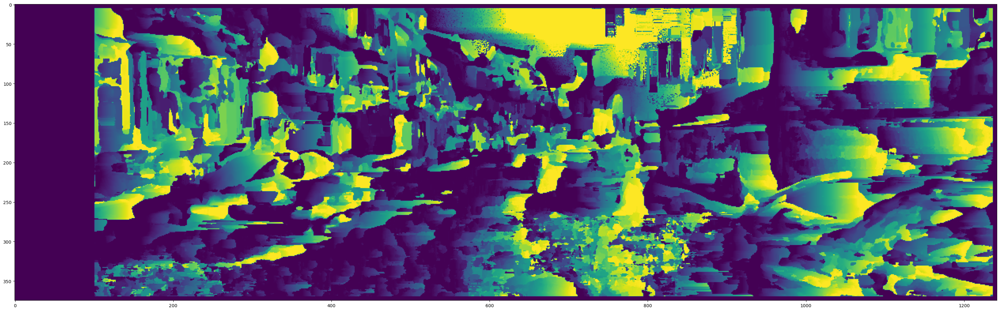

In [38]:
disparity_right = compute_disparity(img_right_gray, img_pair=img_left_gray, num_disparities=disparity_left.kwargs["num_disparities"], block_size=disparity_left.kwargs["block_size"], matcher=disparity_left.kwargs["matcher"])
disparity_left = disparity_left.result

Text(0.5, 1.0, 'Disparity Right')

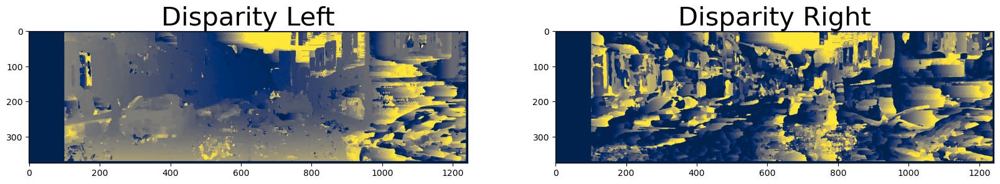

In [39]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(disparity_left,  cmap="cividis") # or CMRmap_r 
ax1.set_title('Disparity Left', fontsize=30)
ax2.imshow(disparity_right, cmap="cividis")
ax2.set_title('Disparity Right', fontsize=30)

#cv2.imwrite("output/disparity.png",disparity_left)

**From now on, we'll only focus on the image "disparity left".**

# Step 3 - Get Projection Matrices

In [40]:
print("Calibration file for image: ", open(calib_files[index]))
print(open(calib_files[index]).read())

Calibration file for image:  <_io.TextIOWrapper name='data/calib\\000050.txt' mode='r' encoding='utf-8'>
P0: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 0.000000000000e+00 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 0.000000000000e+00 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 0.000000000000e+00
P1: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 -3.875744000000e+02 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 0.000000000000e+00 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 0.000000000000e+00
P2: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 4.485728000000e+01 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 2.163791000000e-01 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 2.745884000000e-03
P3: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 -3.395242000000e+02 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 2.199936000000e+00 0.000000000000e+00 0.000000000000e+00 1.0

The following lines will help us parse the dataset to collect desired information.

Note: We are skipping P0 and P1 as they represent grayscale data.

In [41]:
def get_calibration_parameters(file):
    with open(file, 'r') as f:
        fin = f.readlines()
        for line in fin:
            if line[:2] == 'P2':
                p_left = np.array(line[4:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:2] == 'P3':
                p_right = np.array(line[4:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:7] == 'R0_rect':
                p_ro_rect = np.array(line[9:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:14] == 'Tr_velo_to_cam':
                p_velo_to_cam = np.array(line[16:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:14] == 'Tr_imu_to_velo':
                p_imu_to_velo = np.array(line[16:].strip().split(" ")).astype('float32').reshape(3,-1)
    return p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo

p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo = get_calibration_parameters(calib_files[index])

np.set_printoptions(precision=5)
print("Left P Matrix")
print(p_left)
print("Right P Matrix")
print(p_right)
print("RO to Rect Matrix")
print(p_ro_rect)
print("Velodyne to Camera Matrix")
print(p_velo_to_cam)
print("IMU to Velodyne Matrix")
print(p_imu_to_velo)

Left P Matrix
[[7.21538e+02 0.00000e+00 6.09559e+02 4.48573e+01]
 [0.00000e+00 7.21538e+02 1.72854e+02 2.16379e-01]
 [0.00000e+00 0.00000e+00 1.00000e+00 2.74588e-03]]
Right P Matrix
[[ 7.21538e+02  0.00000e+00  6.09559e+02 -3.39524e+02]
 [ 0.00000e+00  7.21538e+02  1.72854e+02  2.19994e+00]
 [ 0.00000e+00  0.00000e+00  1.00000e+00  2.72991e-03]]
RO to Rect Matrix
[[ 0.99992  0.00984 -0.00745]
 [-0.00987  0.99994 -0.00428]
 [ 0.0074   0.00435  0.99996]]
Velodyne to Camera Matrix
[[ 7.53374e-03 -9.99971e-01 -6.16602e-04 -4.06977e-03]
 [ 1.48025e-02  7.28073e-04 -9.99890e-01 -7.63162e-02]
 [ 9.99862e-01  7.52379e-03  1.48076e-02 -2.71781e-01]]
IMU to Velodyne Matrix
[[ 9.99998e-01  7.55307e-04 -2.03583e-03 -8.08676e-01]
 [-7.85403e-04  9.99890e-01 -1.48230e-02  3.19556e-01]
 [ 2.02441e-03  1.48245e-02  9.99888e-01 -7.99723e-01]]


# Step 4 - Compute the Depth Map

A depth map is a map that contains, for each pixel, the depth information.

**How to get depth information?**

From our formulas, we defined the following:

$$Z = \frac{f b}{x_L -x_R}$$


 We have:

*   The focal length, $f$
*   The baseline, $b$
*   The disparity value, for each pixel

👉 The depth map is a map that contains $Z$ for each pixel



In [42]:
def decompose_projection_matrix(p): 
    k, r, t, _, _, _, _ = cv2.decomposeProjectionMatrix(p)
    t = t / t[3] # Back from homogeneous
    return k, r, t

# Decompose each matrix
k_left, r_left, t_left = decompose_projection_matrix(p_left)
k_right, r_right, t_right = decompose_projection_matrix(p_right)

# Display the matrices
print("k_left \n", k_left)
print("\nr_left \n", r_left)
print("\nt_left \n", t_left)
print("\nk_right \n", k_right)
print("\nr_right \n", r_right)
print("\nt_right \n", t_right)

k_left 
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]

r_left 
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]

t_left 
 [[-5.98493e-02]
 [ 3.57927e-04]
 [-2.74588e-03]
 [ 1.00000e+00]]

k_right 
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]

r_right 
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]

t_right 
 [[ 0.47286]
 [-0.00239]
 [-0.00273]
 [ 1.     ]]


In [43]:
def calc_depth_map(disp_left, k_left, t_left, t_right):
    ########### TODO 3 ###########
    # Your code here
    # Get the focal length from the K matrix
    focal_length = k_left[0, 0]
    # Get the distance between the cameras from the t matrices (baseline)
    baseline = np.sqrt(np.sum((t_left - t_right)**2))
    # Replace all instances of 0 and -1 disparity with a small minimum value (to avoid div by 0 or negatives)
    disp_left[disp_left <= 0] = np.min(disp_left[disp_left > 0])
    # Initialize the depth map to match the size of the disparity map
    depth_map = np.zeros_like(disp_left, dtype=np.float32)
    # Calculate the depths 
    depth_map = focal_length * baseline / disp_left
    ########### TODO 3 ###########
    return depth_map

# Get the depth map by calling the above function
depth_map_left = calc_depth_map(disparity_left, k_left, t_left, t_right)
depth_map_right = calc_depth_map(disparity_right, k_right, t_right, t_left)

Text(0.5, 1.0, 'Depth Right')

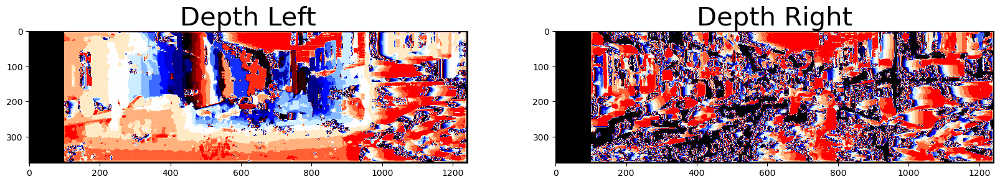

In [44]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(depth_map_left,cmap='flag') # or flag
ax1.set_title('Depth Left', fontsize=30)
ax2.imshow(depth_map_right,cmap='flag') # or flag
ax2.set_title('Depth Right', fontsize=30)


# The Full Pipeline

In [49]:
def pipeline(img_left, img_right, p_left, p_right):
    "For a pair of 2 Calibrated Images"
    ########### TODO 4 ###########
    # Your code here

    # Reading the Left Images
    img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
    # Reading the right Images
    img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
    # Compute the Disparity Map
    disparity_left = compute_disparity(img_left_gray, img_right_gray, matcher="bm")
    # Get the Calibration Parameters
    k_left, _, t_left = decompose_projection_matrix(p_left)
    k_right, _, t_right = decompose_projection_matrix(p_right)
    # Compute the Depth Map
    depth_map = calc_depth_map(disparity_left, k_left, t_left, t_right)
    ########### TODO 4 ###########
    return depth_map

start compute
end compute


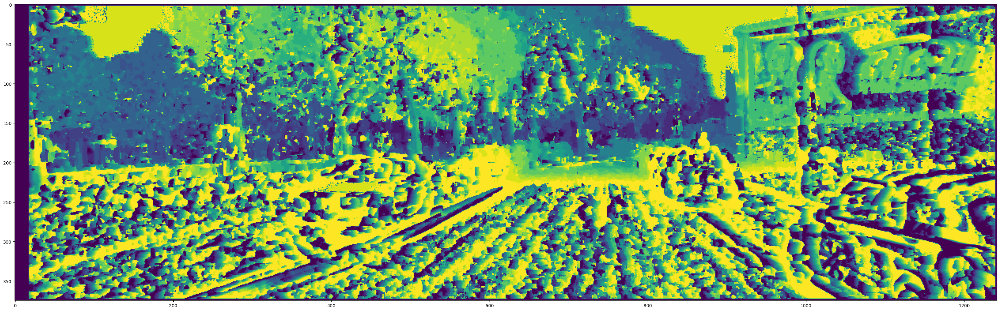

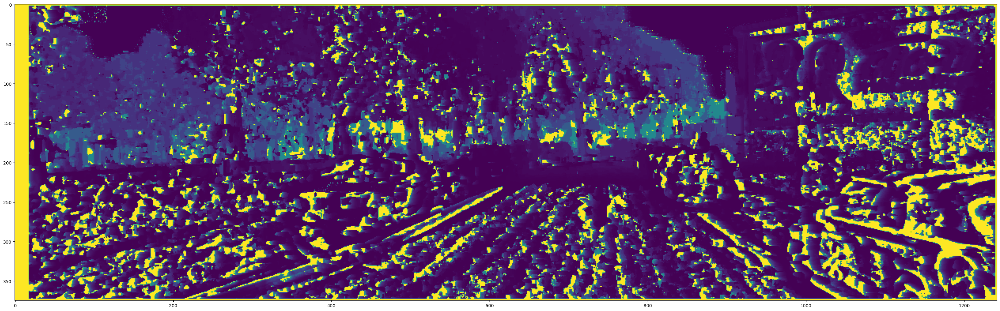

In [50]:
index  = 3
img_left = cv2.imread(images_L[index])
img_right = cv2.imread(images_R[index])
p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo = get_calibration_parameters(calib_files[index])

final = pipeline(img_left, img_right, p_left, p_right)
plt.figure(figsize = (40,20))
plt.imshow(final)
plt.show()